In [1]:
from astropy.io import fits
import astropy.units as u
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks
from scipy.signal import resample

from rascal.calibrator import Calibrator
from rascal.util import refine_peaks

%matplotlib inline

/usr/local/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
spectra = np.fliplr(np.load("data_lt_frodo/frodo_arc.npy"))

In [3]:
def solve_frodo(spectrum, plot_peaks=False, plot_fit=False):
    spectrum[spectrum <= 0] = 1e-9
     
    peaks, _ = find_peaks(spectrum, prominence=300, distance=20)
    refined_peaks = refine_peaks(spectrum, peaks, window_width=3)

    if plot_peaks:
        intensity_range = max(spectrum) - min(spectrum)
        fig = plt.figure(figsize=(16,8))
        ax = fig.add_subplot("110")
        ax.plot(spectrum)
        ax.vlines(refined_peaks,
                  spectrum[refined_peaks.astype('int')]+0.05*intensity_range,
                  max(spectrum)+0.05*intensity_range,
                  linestyle='dashed',
                  alpha=0.4,
                  color='red')
        plt.xlabel("Pixel")
        plt.ylabel("Intensity (arbitrary)")
        plt.ylim(0,20000)
        plt.show()
    
    c = Calibrator(refined_peaks, min_wavelength=5600,
                      max_wavelength=8100,
                      num_pix=len(spectrum))

    c.set_fit_constraints(range_tolerance=200, ransac_thresh=1)
    c.add_atlas("Xe", min_wavelength=5900)
    
    best_p, rms, residual, peak_utilisation = c.fit(max_tries=10000)

    best_p, x_fit, y_fit, residual, peak_utilisation = c.match_peaks_to_atlas(best_p, polydeg=5, tolerance=0.5)

    if plot_fit:
        c.plot_fit(spectrum, best_p, plot_atlas=True, tolerance=0.2)
        
    fit_diff = c.polyval(x_fit, best_p)-y_fit

    rms = np.sqrt(np.sum(fit_diff**2/len(x_fit)))

    print("Stdev error: {} A".format(fit_diff.std()))
    
    return fit_diff.std(), best_p, c

Run the wavelength calibration for the 144 fibres.

In [4]:
frodo_results = [solve_frodo(spectrum) for spectrum in spectra]


Stdev error: 0.09850972103028781 A



Stdev error: 0.09035055628159998 A


/usr/local/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)



Stdev error: 0.09018056655842556 A



Stdev error: 0.09147651985331698 A



Stdev error: 0.0951473038248628 A



Stdev error: 0.09735328783288591 A



Stdev error: 0.09468708441323728 A



Stdev error: 0.09204060742284849 A



Stdev error: 0.0903077119750586 A



Stdev error: 0.06601078413779207 A



Stdev error: 0.0938087221907333 A



Stdev error: 0.09422813599221383 A



Stdev error: 0.09498315647252609 A



Stdev error: 0.104625959700166 A



Stdev error: 0.09278950264674657 A



Stdev error: 0.09680313058507951 A



Stdev error: 0.09706762578571196 A



Stdev error: 0.09324398457836446 A



Stdev error: 0.08859372914250772 A



Stdev error: 0.09211074316703478 A



Stdev error: 0.07487719388444365 A



Stdev error: 0.09142185221630898 A



Stdev error: 0.09281554919391058 A



Stdev error: 0.09850469153262614 A



Stdev error: 0.0956026736165301 A



Stdev error: 0.10712205237557308 A



Stdev error: 0.10238424244548634 A



Stdev error: 0.07270419718010047 A



Stdev error: 0.09782243496003216 A



Stdev error: 0.09939304508531117 A



Stdev error: 0.09394952741622466 A



Stdev error: 0.1024531256864774 A



Stdev error: 0.1006437420383256 A



Stdev error: 0.10143929207341561 A



Stdev error: 0.09748211184542405 A



Stdev error: 0.0997204170063073 A



Stdev error: 0.09532068340727104 A



Stdev error: 0.10093694925978822 A



Stdev error: 0.09677882167372509 A



Stdev error: 0.09957263382263974 A



Stdev error: 0.0980690238971035 A



Stdev error: 0.10819875089344083 A



Stdev error: 0.09698380212383673 A



Stdev error: 0.11545658723771655 A



Stdev error: 0.09914793243883427 A



Stdev error: 0.09320803981712569 A



Stdev error: 0.10014091093272287 A



Stdev error: 0.09800249768018601 A



Stdev error: 0.09493380040963564 A



Stdev error: 0.09937061326999029 A



Stdev error: 0.10133028368081094 A



Stdev error: 0.09951857287210363 A



Stdev error: 0.10487210132754146 A



Stdev error: 0.1008265589933563 A



Stdev error: 0.10132708513884263 A



Stdev error: 0.10137515059122988 A



Stdev error: 0.07626208190299122 A



Stdev error: 0.09729643387127973 A



Stdev error: 0.08605198120680531 A



Stdev error: 0.09503690984629287 A



Stdev error: 0.0968771261840621 A



Stdev error: 0.09718022877346949 A



Stdev error: 0.0941836387044861 A



Stdev error: 0.10754870802433386 A



Stdev error: 0.11751957162274487 A



Stdev error: 0.09229747908301197 A



Stdev error: 0.09957993569853321 A



Stdev error: 0.09431679231148353 A



Stdev error: 0.10653164287702752 A



Stdev error: 0.10561624401574665 A



Stdev error: 0.10589278967683026 A



Stdev error: 0.11140873856273707 A



Stdev error: 0.09366673248682988 A



Stdev error: 0.09526290411334455 A



Stdev error: 0.10742583926859071 A



Stdev error: 0.09867854604554974 A



Stdev error: 0.11010360075029305 A



Stdev error: 0.11129093829333157 A



Stdev error: 0.10403332842976303 A



Stdev error: 0.11333563292319335 A



Stdev error: 0.10539398779891056 A



Stdev error: 0.10274968428515062 A



Stdev error: 0.10317634491505745 A



Stdev error: 0.09974034872194792 A



Stdev error: 0.10596021324874223 A



Stdev error: 0.10364773127733477 A



Stdev error: 0.10523082777136966 A



Stdev error: 0.09893501450856088 A



Stdev error: 0.09278819824137631 A



Stdev error: 0.10358706653511003 A



Stdev error: 0.11367857691000598 A



Stdev error: 0.09351131834822782 A



Stdev error: 0.10083992317643074 A



Stdev error: 0.10237453440646964 A



Stdev error: 0.09967268043810412 A



Stdev error: 0.09549418385321129 A



Stdev error: 0.1055276788934136 A



Stdev error: 0.10974072709833532 A



Stdev error: 0.10559839787404605 A



Stdev error: 0.10141608677783827 A



Stdev error: 0.10065701997939594 A



Stdev error: 0.10372933039504659 A



Stdev error: 0.09699460533979815 A



Stdev error: 0.10002335081151978 A



Stdev error: 0.09911924224583904 A



Stdev error: 0.09861370288998816 A



Stdev error: 0.09863359142654395 A



Stdev error: 0.10876556412441304 A



Stdev error: 0.08325610123321432 A



Stdev error: 0.0804270572301164 A



Stdev error: 0.10389266571407602 A



Stdev error: 0.10594970027113082 A



Stdev error: 0.11157186729537862 A



Stdev error: 0.08998683837163476 A



Stdev error: 0.1140835879462959 A



Stdev error: 0.07794835071625594 A



Stdev error: 0.10610264365405805 A



Stdev error: 0.1132090149103318 A



Stdev error: 0.09700604889713145 A



Stdev error: 0.10560786687954707 A



Stdev error: 0.10312210980430911 A



Stdev error: 0.101963888171488 A



Stdev error: 0.10911987354387453 A



Stdev error: 0.10158294737539901 A



Stdev error: 0.1035588503238853 A



Stdev error: 0.10238232912357646 A



Stdev error: 0.10673110742201243 A



Stdev error: 0.10112836324081079 A



Stdev error: 0.10168798262129736 A



Stdev error: 0.1007033834770447 A



Stdev error: 0.1023118001455012 A



Stdev error: 0.10021369760119372 A



Stdev error: 0.07822027552719624 A



Stdev error: 0.09602319045709502 A



Stdev error: 0.09462390466169547 A



Stdev error: 0.09893004160143425 A



Stdev error: 0.10946475027335195 A



Stdev error: 0.0986492914652917 A



Stdev error: 0.10120168009658052 A



Stdev error: 0.09615566661751203 A



Stdev error: 0.0987089156472656 A



Stdev error: 0.11010992429831284 A



Stdev error: 0.10728985071854362 A



Stdev error: 0.09673550785000015 A


In [5]:
errs = np.array([res[0] for res in frodo_results])

Text(0, 0.5, 'Count')

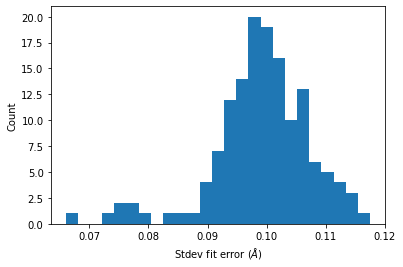

In [6]:
a = plt.hist(errs, 25)
plt.xlabel("Stdev fit error ($\AA$)")
plt.ylabel("Count")

In [7]:
init_wavelength = np.array([res[1][-1] for res in frodo_results])

Text(0, 0.5, 'Initial wavelength ($\\AA$)')

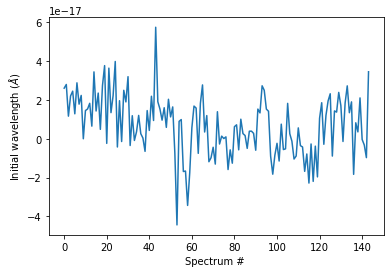

In [8]:
plt.plot(init_wavelength)
plt.xlabel("Spectrum # ")
plt.ylabel("Initial wavelength ($\AA$)")

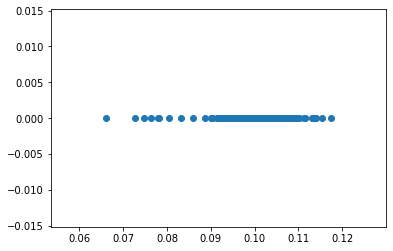

In [9]:
plt.scatter(errs, init_wavelength)

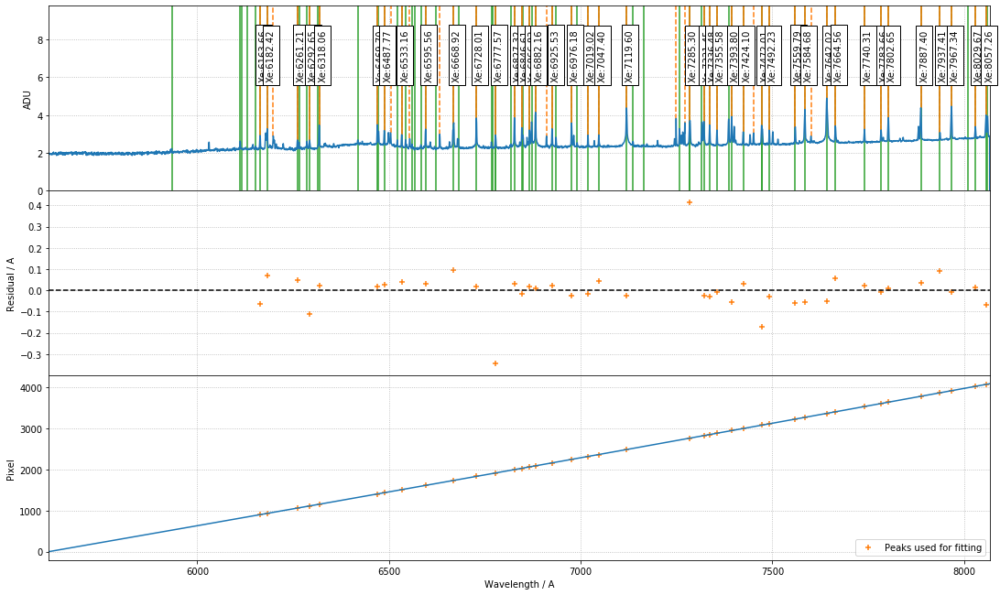

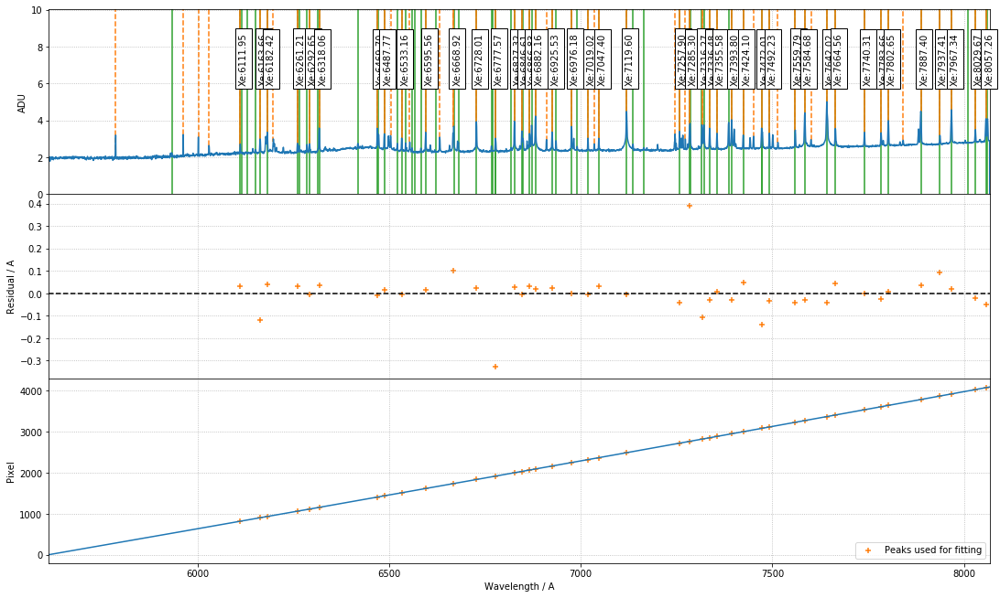

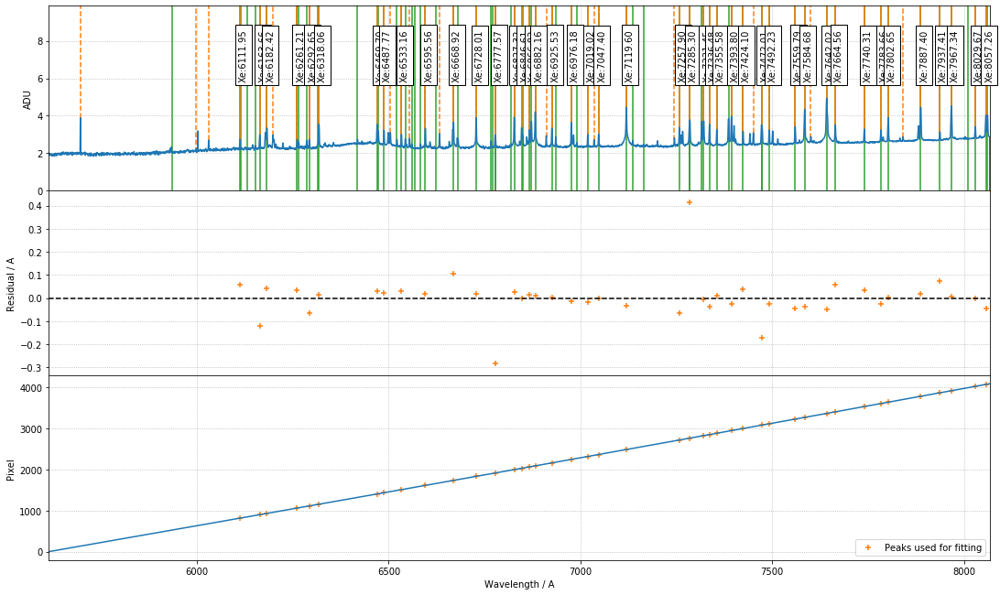

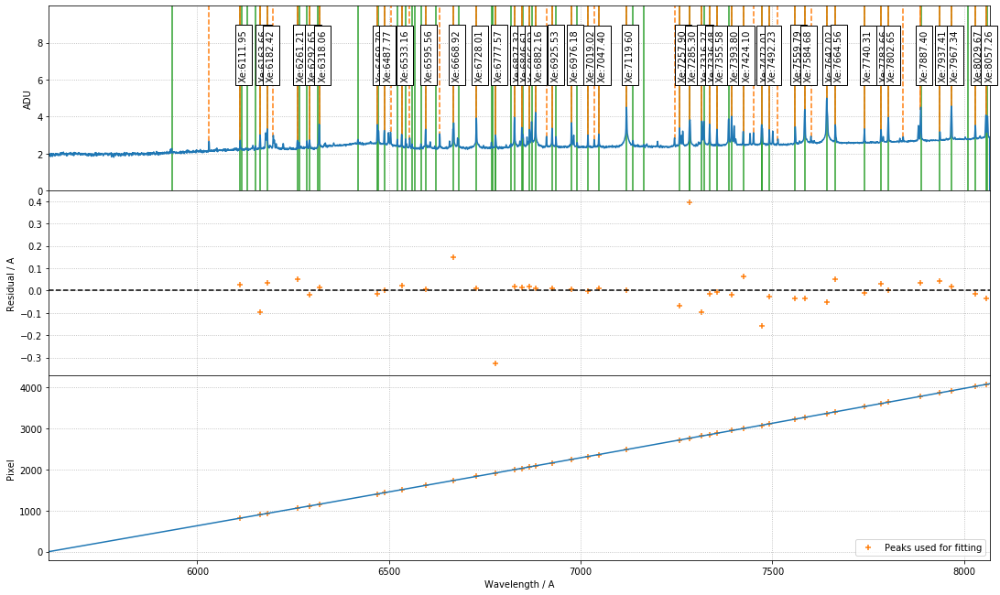

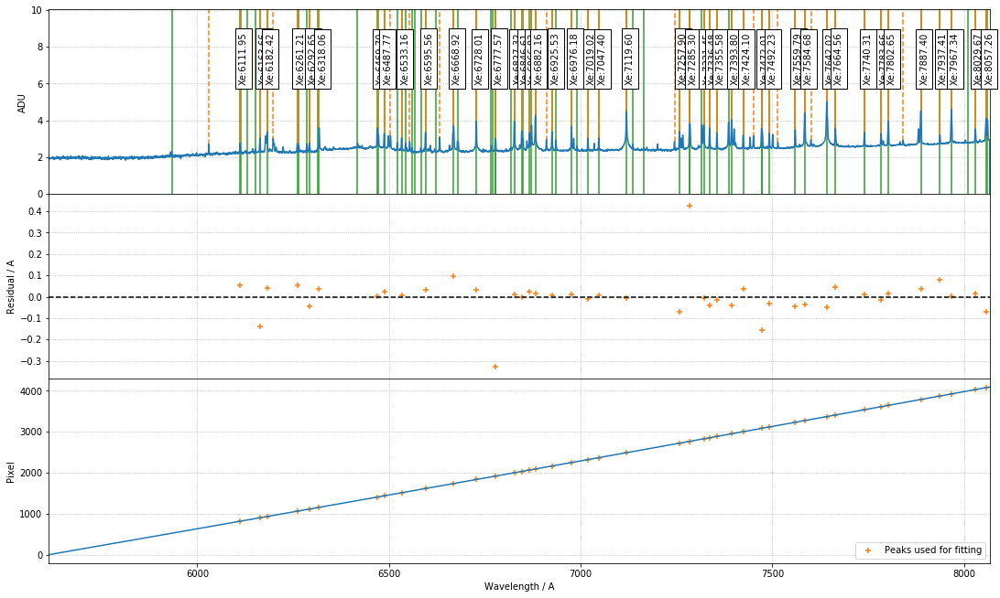

...

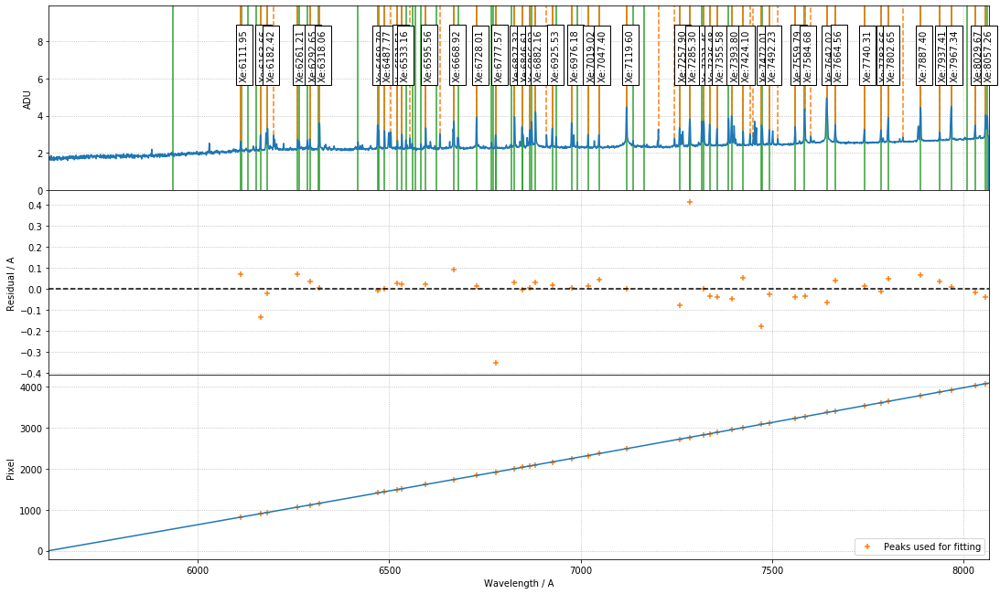

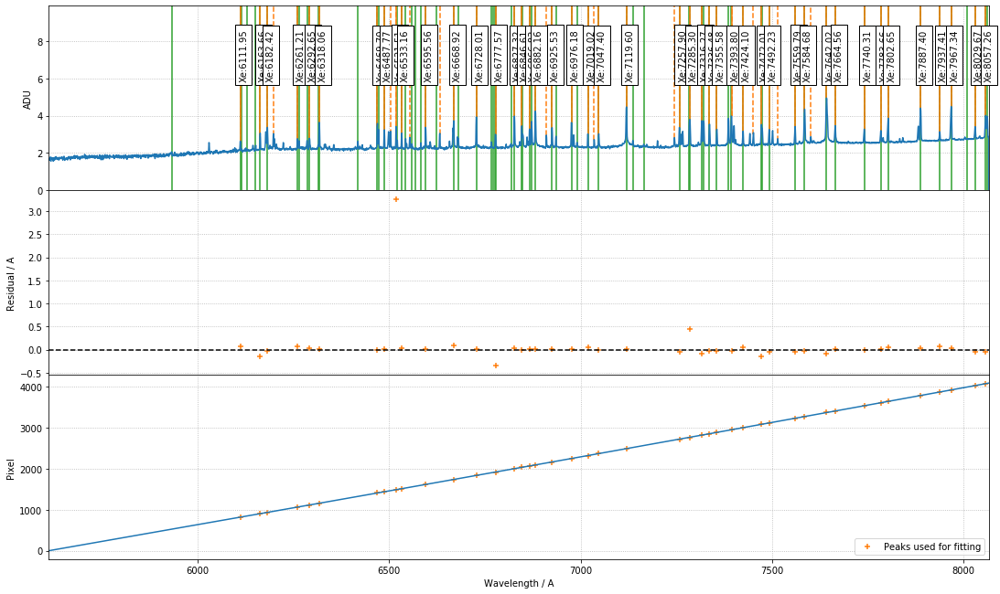

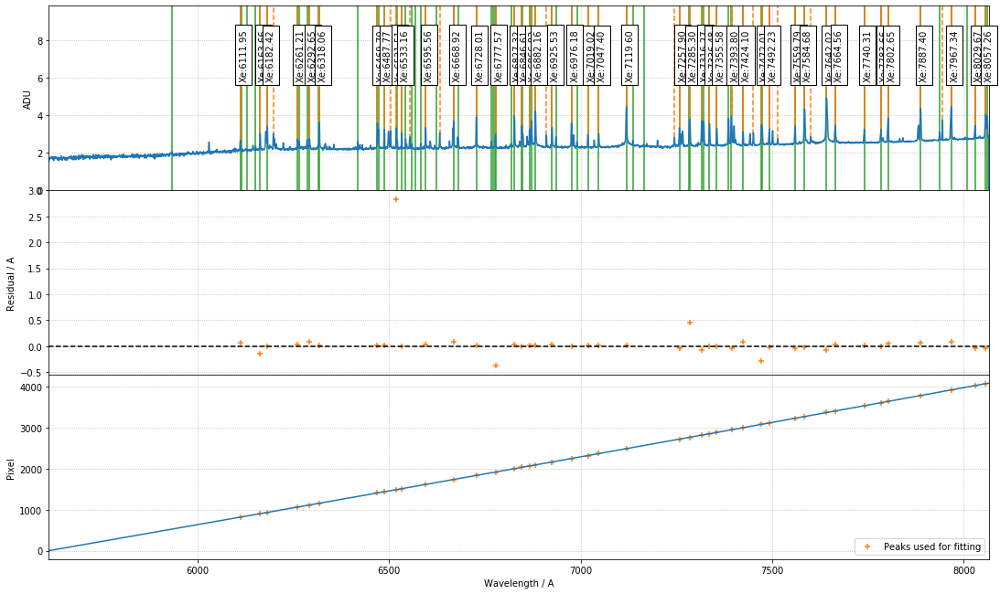

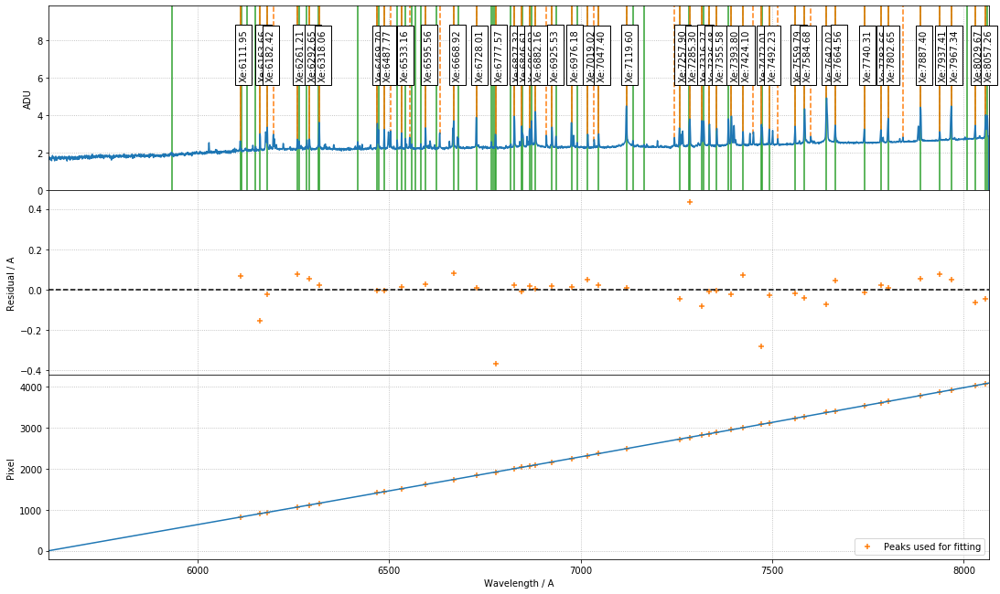

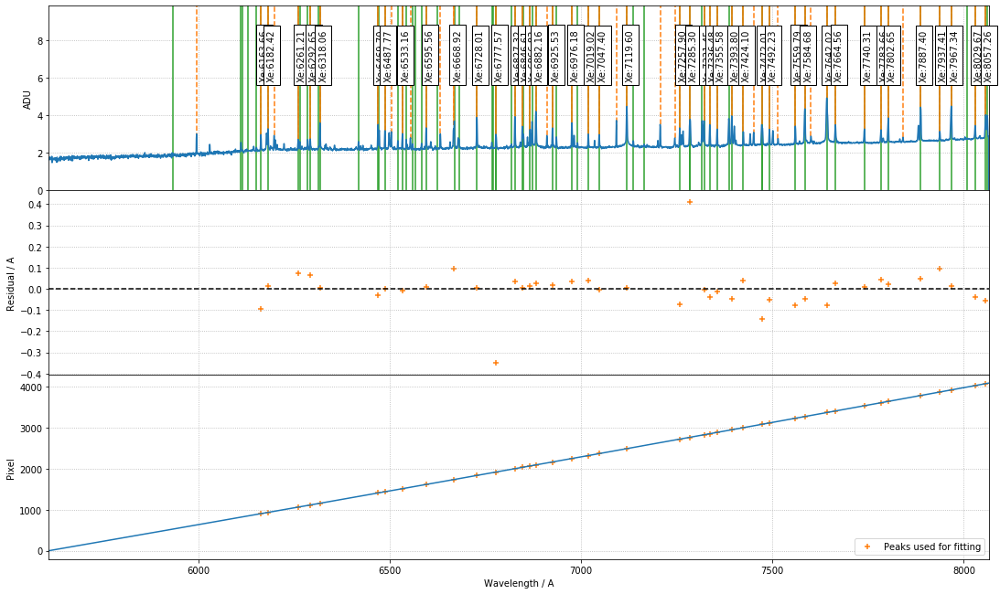

In [10]:
for spectrum, res in zip(spectra, frodo_results):
    fit = res[1]
    c = res[2]
    c.plot_fit(spectrum, fit)